In [1]:
%%bash
which wget
which unzip
if [ -d coco ]; then
    echo coco exists
else
    echo coco missing, downloading...
    mkdir coco
    cd coco
    wget http://images.cocodataset.org/annotations/annotations_trainval2014.zip
    unzip annotations_trainval2014.zip
    rm annotations_trainval2014.zip
    wget http://images.cocodataset.org/zips/train2014.zip
    unzip train2014.zip
    rm train2014.zip
    wget http://images.cocodataset.org/zips/val2014.zip
    unzip val2014.zip
    rm val2014.zip
fi

/usr/bin/wget
/usr/bin/unzip
coco exists


In [2]:
!pip install pycocotools
!pip install pytorch-nlp

    100% |████████████████████████████████| 1.5MB 18.6MB/s ta 0:00:01
  Running setup.py bdist_wheel for pycocotools ... done
  Stored in directory: /home/ec2-user/.cache/pip/wheels/dc/e6/36/0e1ae88c868eb42d3f92181b1c9bbd0b217a7ec3da6bd62e55
Successfully built pycocotools
fastai 1.0.59 requires nvidia-ml-py3, which is not installed.
You are using pip version 10.0.1, however version 19.3.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


In [35]:
import torch
from torch import nn
from torchvision import models
from torch.nn.utils.rnn import pack_padded_sequence, pad_packed_sequence
import nltk
nltk.download('punkt')
print(f"torch {torch.__version__}")

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

[nltk_data] Downloading package punkt to /home/ec2-user/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
torch 1.2.0


# Image Encoder
First we fetch a pre-trained convolutional neural network and tweak it slightly so it's not focused on classification anymore. We'll use this to encode our image and then feed that to the caption generator.

In [36]:
class ImageEncoder(nn.Module):
    """Network to encode an image"""
    def __init__(self, out_dim=1000):
        super(ImageEncoder, self).__init__()
        self.resnet = models.resnet152(pretrained=True)
        # it's pretrained, so let's make it not change
        for p in self.resnet.parameters():
            p.requires_grad = False
            
        # the last layer of resnet is Linear that is used for classification
        # we'll change its size, mark it as learnable, and initialize it randomly, since it's not going to be classification anymore
        self.resnet.fc = nn.Linear(self.resnet.fc.in_features, out_dim) # constructing it marks it as learnable as well
        assert(all(p.requires_grad for p in self.resnet.fc.parameters()))
        self.resnet.fc.weight.data.normal_(0, 0.02) # weights to a small number
        self.resnet.fc.bias.data.fill_(0) # bias to zero
        
        # TODO: maybe it also makes sense to tweak the one layer before that, that is, the pooling layer
    
    def forward(self, x):
        return self.resnet(x)        

# Caption Generator
This is a recurrent neural network that is first initialized with the encoded image and then starts generating words that will be used as the generated caption. The word embeddings are pretrained.

In [37]:
class PartiallyFixedEmbedding(nn.Module): # from https://discuss.pytorch.org/t/updating-part-of-an-embedding-matrix-only-for-out-of-vocab-words/33297/4
    """
    This embedding has an embedding matrix that is split into two parts: fixed and variable.
    The fixed part is not changed in the learning process, making it ideal for pretrained vocabularies with a few extra words that we want to learn.
    """
    def __init__(self, fixed_weights, num_to_learn):
        super().__init__()
        self.num_fixed = fixed_weights.size(0)
        self.num_to_learn = num_to_learn
        weight = torch.empty(self.num_fixed + num_to_learn, fixed_weights.size(1))
        weight[:self.num_fixed] = fixed_weights
        self.trainable_weight = nn.Parameter(torch.empty(num_to_learn, fixed_weights.size(1)))
        nn.init.kaiming_uniform_(self.trainable_weight)
        weight[self.num_fixed:] = self.trainable_weight
        self.register_buffer('weight', weight)
        
    def forward(self, inp):
        self.weight.detach_()
        self.weight[self.num_fixed:] = self.trainable_weight
        return nn.functional.embedding(inp, self.weight, None, None, 2.0, False, False)

    
class Vocabulary(object):
    START_TOKEN = '<start>'
    END_TOKEN = '<end>'
    PAD_TOKEN = '<pad>'
    CONTROL_WORDS = [START_TOKEN, END_TOKEN, PAD_TOKEN]
    
    def __init__(self, non_control_words):
        self.control_words_count = len(CaptionGenerator.CONTROL_WORDS)
        
        self.vocab = [w for w in non_control_words] + CaptionGenerator.CONTROL_WORDS
        self.non_control_words = self.vocab[:-self.control_words_count]
        self.word2idx = {w: i for (i, w) in enumerate(self.vocab)}
        
    def get_idx(self, word):
        return self.word2idx[word]
    
    def get_start_token_idx(self):
        return self.word2idx[Vocabulary.START_TOKEN]
    
    def get_end_token_idx(self):
        return self.word2idx[Vocabulary.END_TOKEN]
    
    def get_pad_token_idx(self):
        return self.word2idx[Vocabulary.PAD_TOKEN]
    
    def size(self):
        return len(self.vocab)
    
    def to_sentence(self, indices):
        words = []
        for idx in indices:
            words.append(self.vocab[idx])
        return ' '.join(words)
    
    
class CaptionGenerator(nn.Module):
    CONTROL_WORDS = ['<start>', '<end>', '<pad>']
    
    def __init__(self, vocab, word2vec, encoded_image_size, hidden_size=512, rnn_layers_num=1):
        """
        :param vocab: set of all the words (as strings) in the vocabulary other than CONTROL_WORDS
        :param word2vec: one of the pre-trained models from torchnlp library
        """
        super(CaptionGenerator, self).__init__()
        self.vocab = vocab
        
        self.embed = PartiallyFixedEmbedding(word2vec[vocab.non_control_words], vocab.control_words_count)
        
        self.initial_hidden_state = nn.Linear(encoded_image_size, hidden_size)
        self.initial_cell_state = nn.Linear(encoded_image_size, hidden_size)
        
        self.recurrent_unit = nn.LSTM(word2vec.dim, hidden_size, rnn_layers_num, batch_first=True)
        
        self.linear = nn.Linear(hidden_size, vocab.size())
        
    def forward(self, features, captions, lengths):
        embeddings = self.embed(captions)
        inputs_packed = pack_padded_sequence(embeddings, lengths, batch_first=True)
        
        initial_hidden = self.initial_hidden_state(features)
        initial_hidden = initial_hidden.view(-1, initial_hidden.shape[0], initial_hidden.shape[1])
        initial_cell = self.initial_cell_state(features)
        initial_cell = initial_cell.view(-1, initial_cell.shape[0], initial_cell.shape[1])
        
        hiddens, _ = self.recurrent_unit(inputs_packed, (initial_hidden, initial_cell))
        hiddens, _ = pad_packed_sequence(hiddens, batch_first=True)
        outputs = self.linear(hiddens) # maybe a softmax after that?
        return outputs
    
    def to_sentence(self, forward_out, lengths):
        _, tops = forward_out.topk(1)
        tops = tops.view(tops.shape[0], tops.shape[1])
        sentences = []
        for sentence in tops:
            sentences.append(self.vocab.to_sentence(sentence))
        return sentences

Now let's define the dataloaders for the coco data that we previously downloaded.

In [38]:
from torchvision import transforms
from torchvision.datasets.vision import VisionDataset
from torch.utils import data
from nltk.tokenize import word_tokenize
from PIL import Image
import os

# by default the CocoCaptions dataset yields pairs (image, all_captions), but we want to have the captions in separate data points
class CocoCaptionsWithVocabulary(VisionDataset):
    def __init__(self, root, annFile, transform=None, target_transform=None, transforms=None):
        super(CocoCaptionsWithVocabulary, self).__init__(root, transforms, transform, target_transform)
        from pycocotools.coco import COCO
        coco = COCO(annFile)
        self.anns = [(
            coco.loadImgs(ann['image_id'])[0]['file_name'], 
            [w.lower() for w in word_tokenize(ann['caption'])]
        ) for ann in coco.anns.values()]
        
        all_words = set()
        for _, caption in self.anns:
            for word in caption:
                all_words.add(word)
                
        self.vocab = Vocabulary(all_words)
        print('coco loaded')

    def __getitem__(self, index):
        anns = self.anns
        path, target = anns[index]
        target = torch.tensor([self.vocab.get_start_token_idx()] + 
                              [self.vocab.get_idx(w) for w in target] +
                              [self.vocab.get_end_token_idx()])

        img = Image.open(os.path.join(self.root, path)).convert('RGB')

        if self.transforms is not None:
            img, target = self.transforms(img, target)

        return img, target

    def __len__(self):
        return len(self.anns)

    
def get_coco_data_loader(kind='train', batch_size=32, shuffle=True, num_workers=2):
    """
    :param kind: must be 'train' or 'val'
    """
    transform_images = transforms.Compose([
        transforms.Resize((224, 224)), # TODO: maybe add some cropping or sth? this will squash most of the images
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)), # normalization required by resnet
    ])
    
    coco = CocoCaptionsWithVocabulary(root=f'coco/{kind}2014',
                                      annFile=f'coco/annotations/captions_{kind}2014.json', 
                                      transform=transform_images)
    
    def make_batch(data):
        # sort data by caption length
        data.sort(key=lambda x: len(x[1]), reverse=True)
        images, captions = zip(*data)

        # Merge image tensors (stack)
        images = torch.stack(images, 0)

        caption_lengths = [len(caption) for caption in captions]

        # matrix full of the padding token index
        padded_captions = torch.empty(len(captions), max(caption_lengths)).fill_(coco.vocab.get_pad_token_idx()).long()

        for i, caption in enumerate(captions):
            end = caption_lengths[i]
            padded_captions[i, :end] = caption[:end]
        return images, padded_captions, caption_lengths
    
    return data.DataLoader(dataset=coco,
                           batch_size=batch_size,
                           shuffle=shuffle,
                           num_workers=num_workers,
                           collate_fn=make_batch)

In [54]:
%%time
dl = get_coco_data_loader('train', num_workers=8)

loading annotations into memory...
Done (t=0.67s)
creating index...
index created!
coco loaded
CPU times: user 57.4 s, sys: 3.13 ms, total: 57.4 s
Wall time: 57.4 s


In [55]:
images, captions, lengths = next(iter(dl))
images = images.to(device)
captions = captions.to(device)

In [56]:
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
import numpy as np

%matplotlib inline
def show(img):
    img = make_grid(img, normalize=True)
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)), interpolation='nearest')
    plt.show()

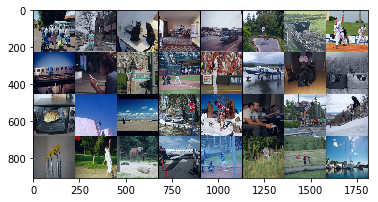

In [57]:
show(images)

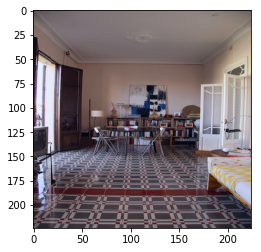

In [58]:
show(images[3])

Let's also check if the data can correctly flow through our networks.

In [59]:
image_encoding_length = 1000

ie = ImageEncoder(image_encoding_length).to(device)
features = ie.forward(images)
print(f"encoded images: {features.shape}")

encoded images: torch.Size([32, 1000])


In [60]:
from torchnlp.word_to_vector import GloVe

vocab = dl.dataset.vocab
cg = CaptionGenerator(vocab, GloVe(), image_encoding_length).to(device)

generated = cg.forward(features, captions, lengths)
print(f"generated: {generated.shape}")

generated: torch.Size([32, 45, 25127])


In [61]:
sentences = cg.to_sentence(generated, lengths)
print(f"number of generated sentences: {len(sentences)}")
newline = '\n'
print(f"here are some of them:\n{newline.join(sentences[:5])}")

number of generated sentences: 32
here are some of them:
sanwich sampling claw-footed bumper bumper bumper samsonite samsonite railed thrust packages packages aol bushel jolicoeur decorarted hovers guages decorarted packages packages packages claw-footed claw-footed magazine packages shiney planted packages packages bended gimp railed shortcake packages packages dtreet 7220 packages samsonite samsonite terra veranda whirlpool baste
linen topper clementines guages keyboard.on samsonite moden packages cathing grave guages saving cent/per east whirlpool whirlpool guages tarred bumper con ofthe whirlpool whirlpool nourishes nourishes nourishes nourishes nourishes nourishes nourishes nourishes nourishes nourishes nourishes nourishes nourishes nourishes nourishes nourishes nourishes nourishes nourishes nourishes nourishes nourishes
smartly a4tech claw-footed baste claw-footed belong shimmering vane bumper bumper hovers waterpik calligraphy packages beanch samsonite enactors log claw-footed n

In [62]:
from torch import optim
from datetime import datetime

def train(num_epochs, data_loader, image_encoder, caption_generator):
    optimizer = optim.Adam(params=
                           list(filter(lambda p: p.requires_grad, image_encoder.parameters())) + 
                           list(filter(lambda p: p.requires_grad, caption_generator.parameters()))) # learning rate default for now
    criterion = nn.CrossEntropyLoss()
    
    for epoch in range(num_epochs):
        image_encoder.train()
        caption_generator.train()
        
        for i, (images, captions, lengths) in enumerate(data_loader):
            images = images.to(device)
            captions = captions.to(device)
            
            t = datetime.now().strftime("%H:%M:%S")
            print(f"{t}\tepoch {epoch}\tbatch {i}", end='\t')
            encoded_images = image_encoder(images)
            outputs = caption_generator(encoded_images, captions, lengths)
            
            # since we want to predict the next word given a word, our target drops the initial <start> and adds an additional <pad>
            pad = data_loader.dataset.vocab.get_pad_token_idx()
            target = torch.cat((captions[:, 1:], torch.empty(captions.shape[0], 1).fill_(pad).long().to(device)), 1)
                                    
            # flatten the data so it fits what the criterion expects
            outputs = outputs.view(-1, outputs.shape[2])
            target = target.view(-1)
            
            loss = criterion(outputs, target)
            print(f"loss {loss.mean()}")
            
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

In [63]:
train(1, dl, ie, cg)

loss 1.639661192893982
22:42:08	epoch 0	batch 12106	loss 1.3220514059066772
22:42:09	epoch 0	batch 12107	loss 1.554799199104309
22:42:10	epoch 0	batch 12108	loss 1.819268822669983
22:42:10	epoch 0	batch 12109	loss 1.2590186595916748
22:42:11	epoch 0	batch 12110	loss 1.6953880786895752
22:42:11	epoch 0	batch 12111	loss 1.6286064386367798
22:42:12	epoch 0	batch 12112	loss 1.5473960638046265
22:42:13	epoch 0	batch 12113	loss 1.4908288717269897
22:42:13	epoch 0	batch 12114	loss 1.0827019214630127
22:42:14	epoch 0	batch 12115	loss 1.358539342880249
22:42:14	epoch 0	batch 12116	loss 1.3122214078903198
22:42:15	epoch 0	batch 12117	loss 1.4438426494598389
22:42:16	epoch 0	batch 12118	loss 1.3662492036819458
22:42:16	epoch 0	batch 12119	loss 1.8335456848144531
22:42:17	epoch 0	batch 12120	loss 1.9396272897720337
22:42:18	epoch 0	batch 12121	loss 1.3314443826675415
22:42:18	epoch 0	batch 12122	loss 1.441999912261963
22:42:19	epoch 0	batch 12123	loss 1.7732901573181152
22:42:19	epoch 0	batch 1212

In [64]:
images, captions, lengths = next(iter(dl))
images = images.to(device)
captions = captions.to(device)

ie.eval()
cg.eval()
features = ie.forward(images)
generated = cg.forward(features, captions, lengths)
sentences = cg.to_sentence(generated, lengths)
sentences

['a red with a items items standing on in a of a building . a doors . <end> <pad>',
 'a table plate topped with a and to a glasses plates of with food . <end> <pad> <pad> <pad>',
 'a pizza sandwich with meat and to a bowl of fries . a plate . <end> <pad> <pad> <pad>',
 'a group of people standing skis on a of a snow covered slope . <end> <pad> <pad> <pad> <pad>',
 'a bus decker bus driving a bus driving by side . a street . <end> <pad> <pad> <pad> <pad>',
 'a man on a shirt and white shorts playing tennis game of tennis . <end> <pad> <pad> <pad> <pad>',
 'a man sitting on a bench in a legs around on a ground of <end> <pad> <pad> <pad> <pad>',
 'a man laying on a of a bed in to a dog . <end> <pad> <pad> <pad> <pad> <pad>',
 "a man of a 's a skateboard in down side of a ramp . <pad> <pad> <pad> <pad> <pad>",
 'a men in playing a video game in . a living room . <end> <pad> <pad> <pad> <pad> <pad>',
 'a cat is on a chair window on a a room . . <end> <pad> <pad> <pad> <pad> <pad>',
 'a plat

In [66]:
torch.save(ie.state_dict(), './encoder')
torch.save(cg.state_dict(), './generator')

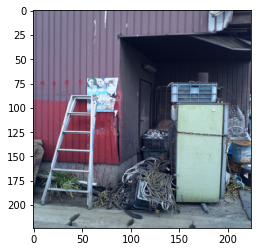

a red with a items items standing on in a of a building . a doors . <end> <pad>


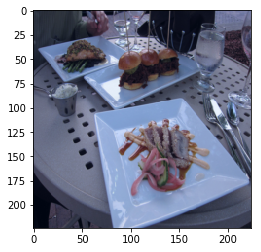

a table plate topped with a and to a glasses plates of with food . <end> <pad> <pad> <pad>


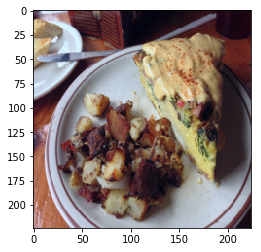

a pizza sandwich with meat and to a bowl of fries . a plate . <end> <pad> <pad> <pad>


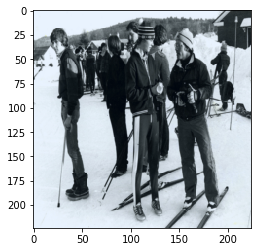

a group of people standing skis on a of a snow covered slope . <end> <pad> <pad> <pad> <pad>


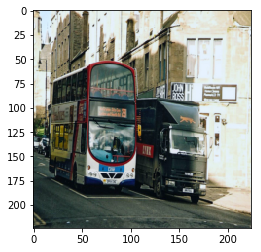

a bus decker bus driving a bus driving by side . a street . <end> <pad> <pad> <pad> <pad>


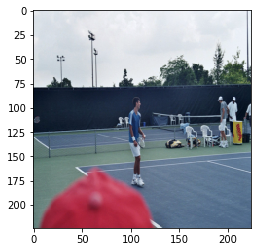

a man on a shirt and white shorts playing tennis game of tennis . <end> <pad> <pad> <pad> <pad>


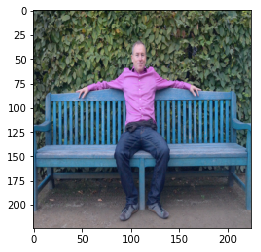

a man sitting on a bench in a legs around on a ground of <end> <pad> <pad> <pad> <pad>


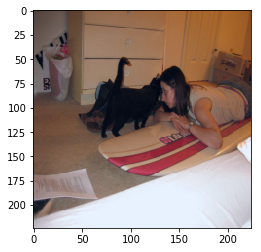

a man laying on a of a bed in to a dog . <end> <pad> <pad> <pad> <pad> <pad>


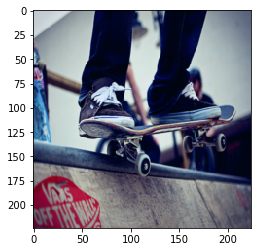

a man of a 's a skateboard in down side of a ramp . <pad> <pad> <pad> <pad> <pad>


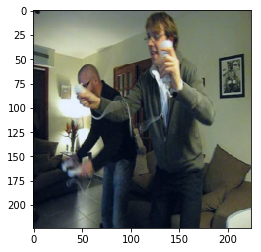

a men in playing a video game in . a living room . <end> <pad> <pad> <pad> <pad> <pad>


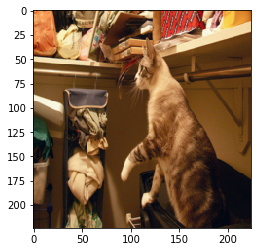

a cat is on a chair window on a a room . . <end> <pad> <pad> <pad> <pad> <pad>


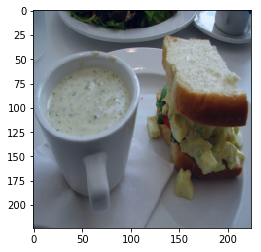

a plate up of a plate on a bowl <end> a table <end> <pad> <pad> <pad> <pad> <pad> <pad>


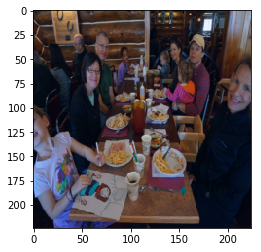

a group of people sitting around a table table . plates . <end> <pad> <pad> <pad> <pad> <pad> <pad>


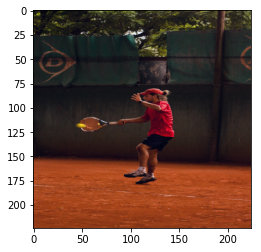

a man holding up the air to holding a tennis ball . <end> <pad> <pad> <pad> <pad> <pad> <pad>


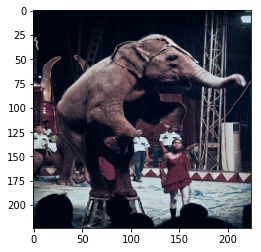

a elephant is in a sidewalk in a head on at . <end> <pad> <pad> <pad> <pad> <pad> <pad>


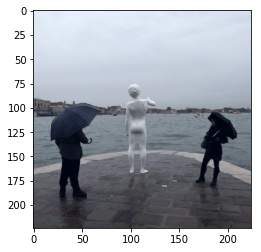

a people are surf on at the kite of a man . <end> <pad> <pad> <pad> <pad> <pad> <pad>


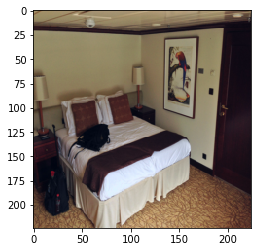

a living bed with a room room white room and bedroom . <end> <pad> <pad> <pad> <pad> <pad> <pad>


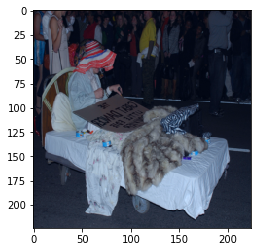

a man laying on a bed with a a teddy . <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad>


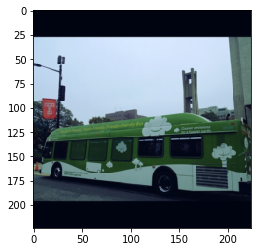

a red and yellow bus is a next to a . <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad>


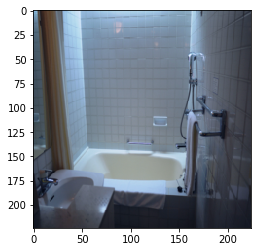

a bathroom toilet tub sitting next to a sink floor . <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad>


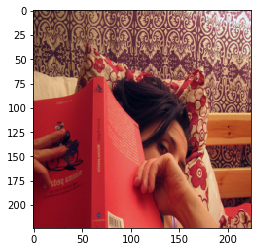

a woman up of a person holding a with a remote <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad>


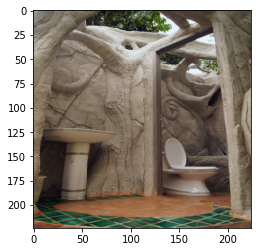

a old umbrella vent with a large and a window <end> <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad>


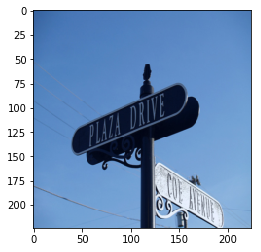

a stop sign with a a is and in . <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>


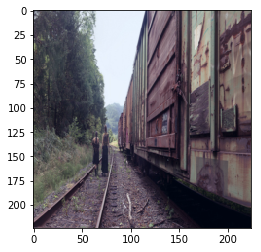

a train train is traveling to a train of tracks . <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>


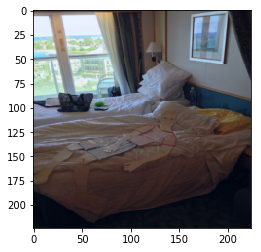

a bed with a white sitting bed a on it <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>


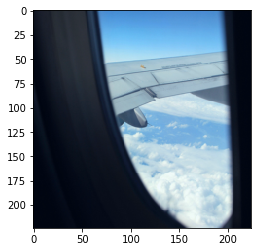

a black of a airplane with in the airport . . <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>


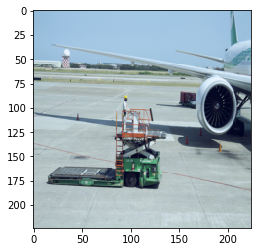

a man riding a skateboard is to a airplane . <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>


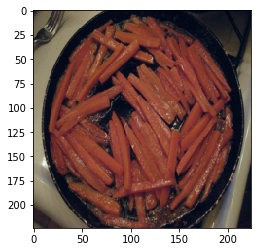

a bowl bowl filled on top wooden top . . <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>


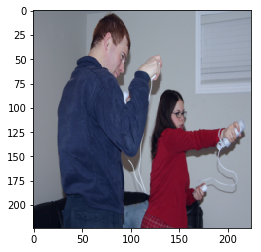

a man in a are a controllers in a living . <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>


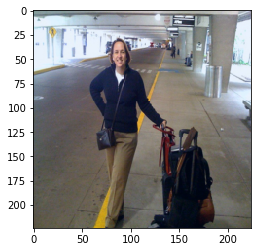

a man standing on a side with a dog . <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>


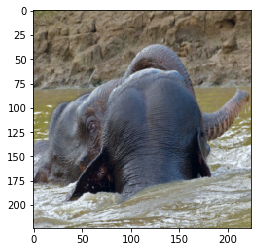

a are in the water near a terrain . <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>


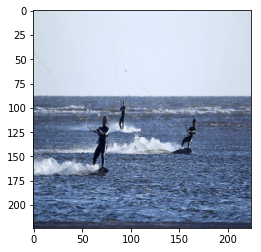

a people are a riding in the water . <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>


In [67]:
for i, s in enumerate(sentences):
    show(make_grid(images[i], normalize=True))
    print(s)

The above aren't so good and that's probably because we're still feeding the original description to the net.

In [102]:
def caption(images, max_len, image_encoder, caption_generator):
    features = image_encoder(images)
    
    initial_hidden = caption_generator.initial_hidden_state(features)
    initial_hidden = initial_hidden.view(-1, initial_hidden.shape[0], initial_hidden.shape[1])
    initial_cell = caption_generator.initial_cell_state(features)
    initial_cell = initial_cell.view(-1, initial_cell.shape[0], initial_cell.shape[1])
    
    state = (initial_hidden, initial_cell)
    
    current_word = torch.empty(images.shape[0]).fill_(caption_generator.vocab.get_start_token_idx()).long().to(device) \
        .view(images.shape[0], -1)
        
    words = []
    for i in range(max_len):
        current_word = caption_generator.embed(current_word)
        out, state = caption_generator.recurrent_unit(current_word, state)
        _, current_word = caption_generator.linear(out).topk(1)
        current_word = current_word.view(-1, 1)
        words.append(current_word)
        
    sentences = torch.cat(words, 1)
    return [caption_generator.vocab.to_sentence(sentence) for sentence in sentences]

torch.Size([32, 1])


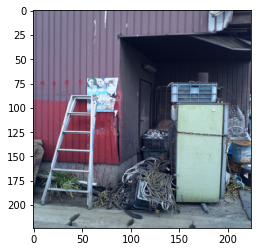

A red and white fire hydrant sitting on the side of a street. 


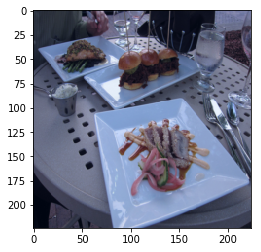

A table with plates of food and a drink. 


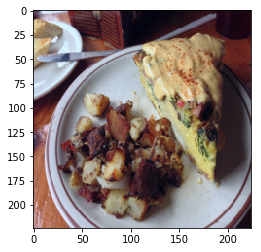

A pizza with a lot of toppings on it 


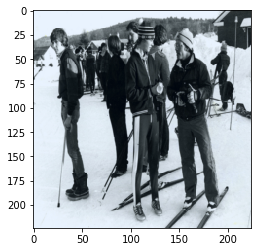

A group of people on skis in the snow. 


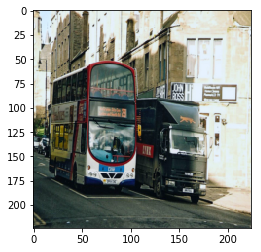

A bus is driving down a street with buildings in the background. 


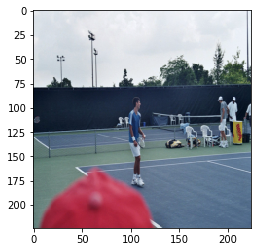

A man on a tennis court with a racket in hand. 


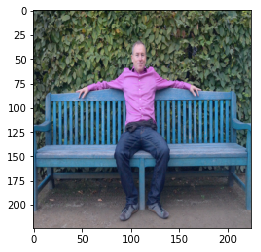

A man sitting on a bench in a park. 


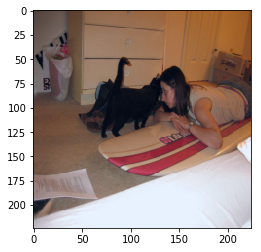

A man sitting on a couch with a dog on his head. 


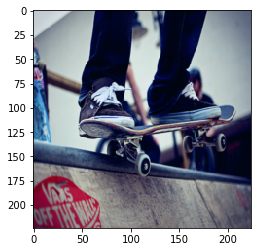

A man in a red shirt and black pants doing a trick on a skateboard. 


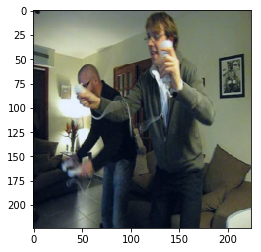

A man in a suit and tie standing in front of a tv. 


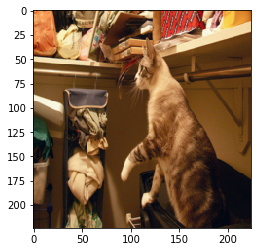

A cat is sitting on a table with a bowl of food. 


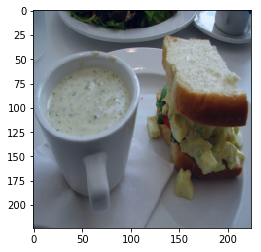

A plate of food with a sandwich and a salad. 


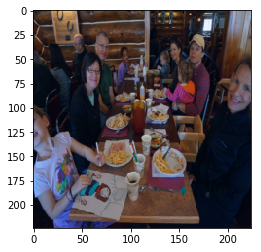

A group of people sitting around a table with plates of food. 


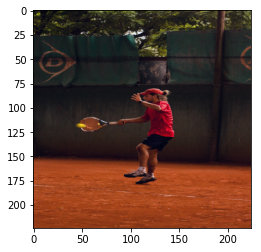

A man holding a tennis racket on a tennis court. 


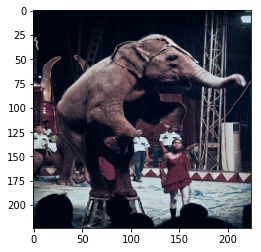

A group of elephants are standing in a field. 


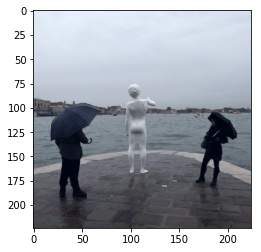

A man is standing on a beach with a surfboard. 


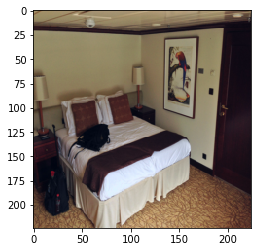

A living room with a couch, chair, and a television. 


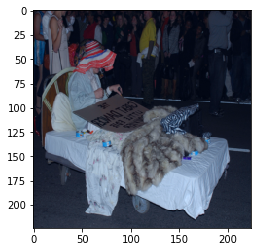

A man sitting on a couch with a dog on his lap. 


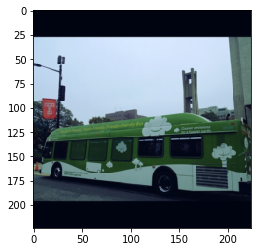

A red and yellow bus is parked in a lot. 


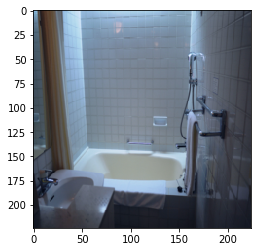

A bathroom with a sink, toilet, shower and shower. 


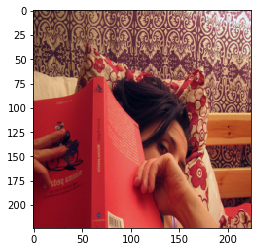

A woman is sitting on a couch with a remote in her hand. 


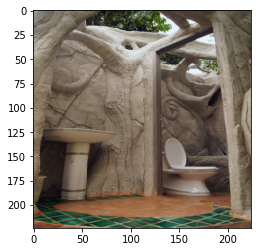

A cat sitting on a bench in a room. 


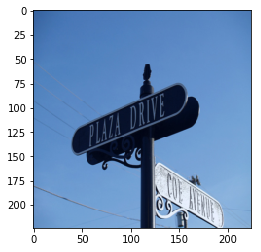

A stop sign with a sign on it. 


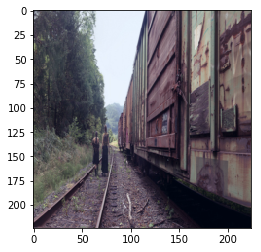

A train is traveling down a track near a building. 


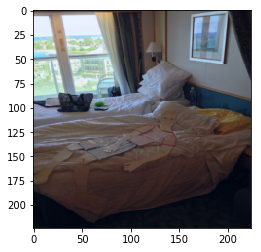

A bed with a white comforter and a white comforter. 


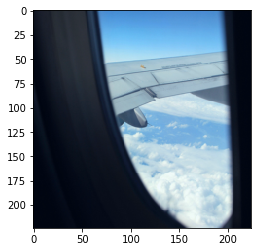

A black and white photo of a train on a track. 


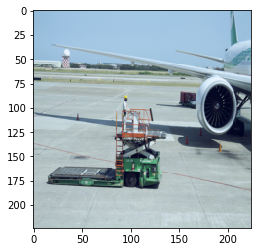

A man riding a skateboard down a street. 


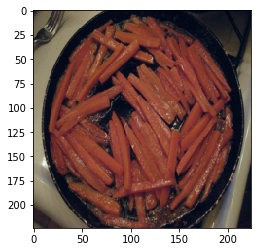

A bowl of soup with a bowl of soup on it. 


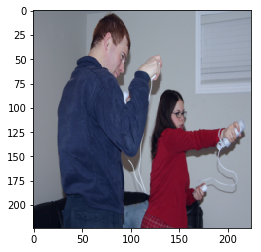

A man in a white shirt and a tie standing in front of a tv. 


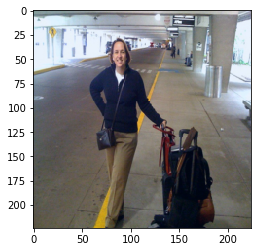

A man is standing on a skateboard in a skate park. 


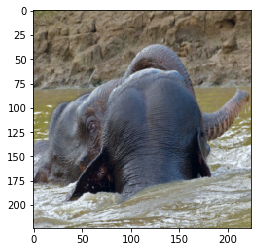

A group of elephants are standing in the water. 


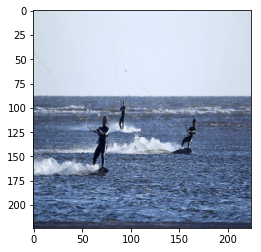

A surfer is riding a wave on a wave. 


In [109]:
captions = caption(images, 25, ie, cg)
for i, c in enumerate(captions):
    show(make_grid(images[i], normalize=True))
    # let's remove the <end> <pad> ..., capitalize and fix some punctuation
    import re
    c = re.sub(r'<end> <pad> .*', '', c).replace(' ,', ',').replace(' .', '.').replace(" 's", "'s").capitalize()
    print(c)

Now let's try with an entirely new dataset.

loading annotations into memory...
Done (t=0.33s)
creating index...
index created!
coco loaded


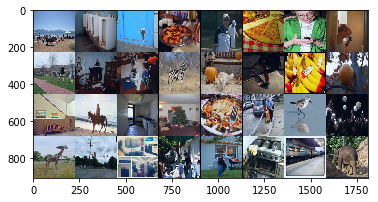

In [112]:
test_data_loader = dl = get_coco_data_loader('val', num_workers=8)
new_images, _, _ = next(iter(test_data_loader))
show(new_images)

torch.Size([32, 1])


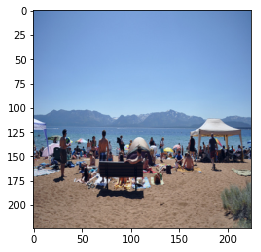

A group of people on a beach with kites. 


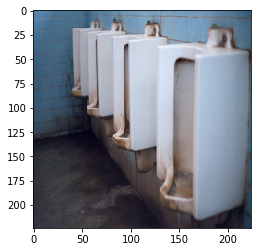

A fire hydrant sitting on a sidewalk next to a street. 


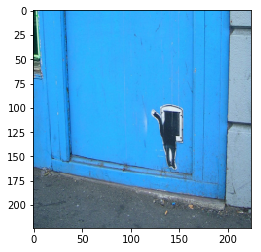

A fire hydrant sitting on a sidewalk next to a street. 


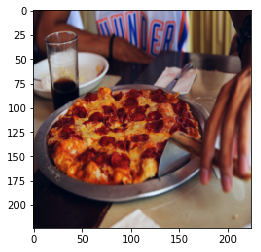

A pizza with a lot of toppings on it 


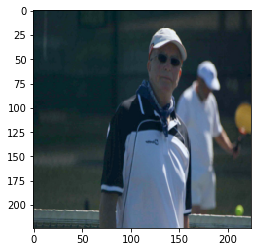

A man holding a tennis racket on a tennis court. 


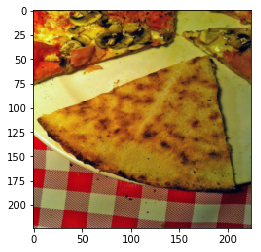

A pizza with a lot of toppings on it 


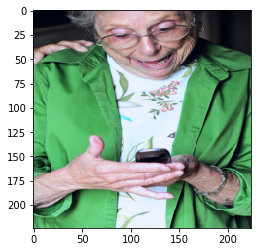

A man holding a cell phone to his ear. 


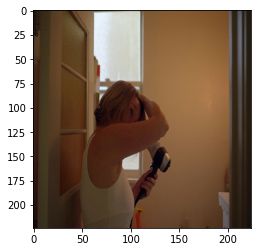

A man in a white shirt and tie standing in front of a mirror. 


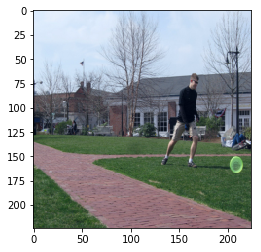

A man in a red shirt and white shorts playing a game of tennis. 


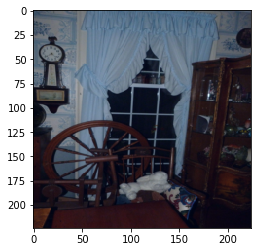

A bed with a white comforter and a white comforter. 


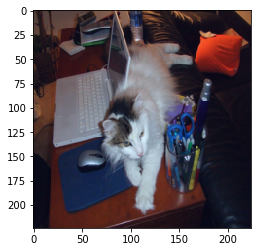

A cat is sitting on a desk with a laptop and a mouse 


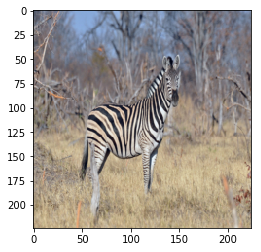

A zebra is standing in a field with trees in the background. 


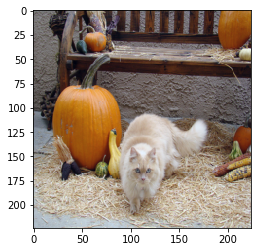

A cat is sitting on a table with a bunch of bananas. 


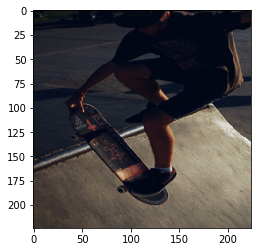

A man is standing on a skateboard in the air. 


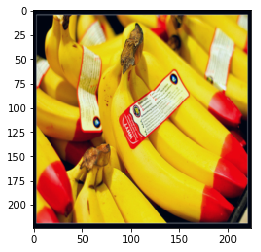

A bunch of bananas sitting on a table. 


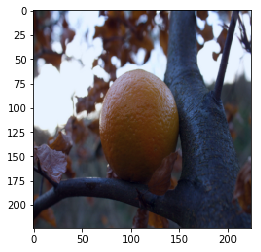

A close up of a banana on a tree 


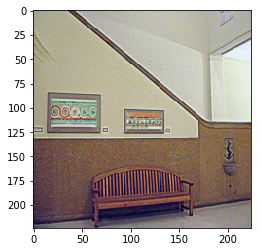

A man is standing in front of a tv. 


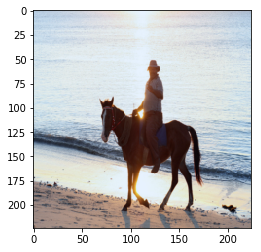

A man is riding a horse on a beach. 


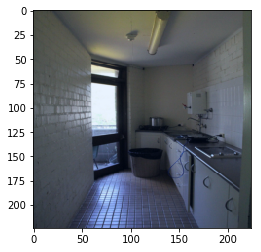

A bathroom with a sink, toilet, shower and shower. 


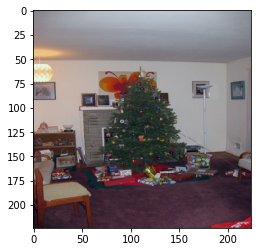

A living room with a couch and a table 


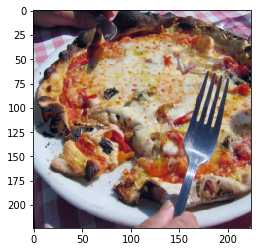

A pizza with a lot of toppings on it 


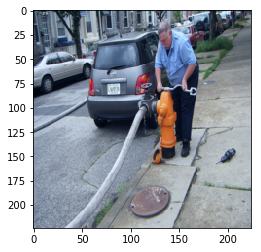

A man standing on a sidewalk next to a car. 


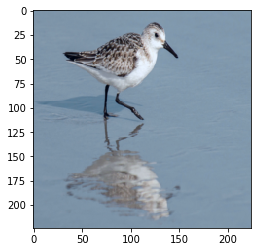

A large brown and white dog standing on top of a lush green field. 


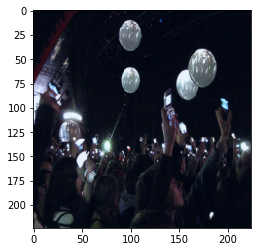

A bunch of different types of clocks on a table. 


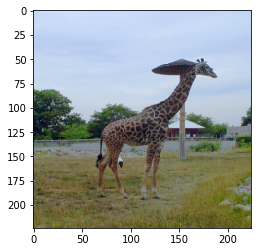

A giraffe standing in a field of grass. 


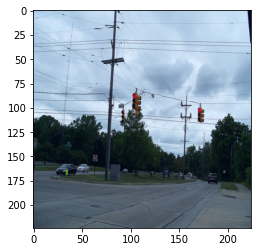

A street sign with a sign on it. 


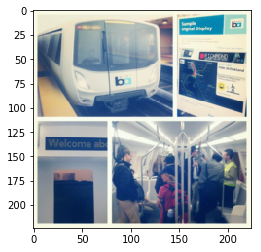

A man in a red jacket and a red tie 


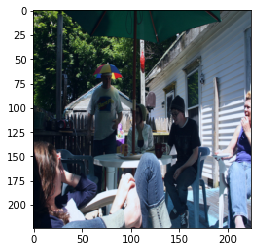

A man and a woman are standing on a bench. 


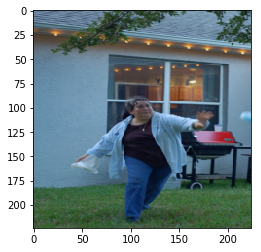

A man sitting on a bench in a park. 


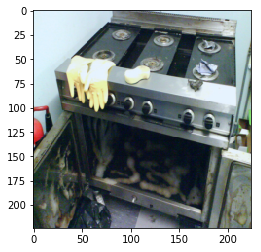

A refrigerator with a bunch of magnets on it 


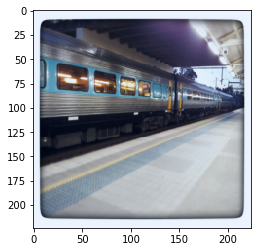

A train is traveling down the tracks in a city. 


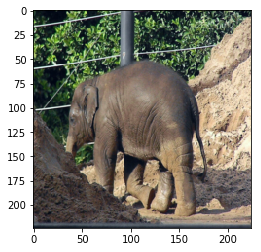

A bear is standing in the grass near a tree. 


In [115]:
new_images = new_images.to(device)
captions = caption(new_images, 25, ie, cg)
for i, c in enumerate(captions):
    show(make_grid(new_images[i], normalize=True))
    # let's remove the <end> <pad> ..., capitalize and fix some punctuation
    import re
    c = re.sub(r'<end> <pad> .*', '', c).replace(' ,', ',').replace(' .', '.').replace(" 's", "'s").capitalize()
    print(c)